# Color Image Quantization using KMeans



## Intro

In this notebook, we aim to experiment color image quantizaions based on k-means and similar algorithms and their optimizations all from scratch. We don't aim to imporve cpu runtime of the models (each quantization is tried to take up to a maximum of 2 minutes).

This notebook shows my lines of thoughts when learning stuff, you can find a more stuctured and well-documented code in the like below:

[Github repo link to be added]

In [ ]:
import numpy as np
import os
import time

# Make sure logs dir exists
os.makedirs('logs', exist_ok=True)

# Set random seed for reproducibility
SEED = 42
np.random.seed(SEED)


## K-means

Let's impelement the base Kmeans algorithm, with a tolerance point to stop earlier.

We will use euclidean distortion (not L2 norms) to evaluate our centroids quality.

In [ ]:
def euc_distance(x, y):
    return np.sqrt(np.sum((x - y) ** 2, axis = 2))

class KMeansV1:
    def __init__(self, K=16, init=None, tol=1e-5, max_iter=25, verbose=False, log_file_name=None):
        self.K = K
        self.tol = tol
        self.max_iter = max_iter
        self.verbose = verbose
        self.log_file_name = log_file_name
        self.centroids = None
        self.centroids = None if init is None else init.copy()

    def init_centroids(self, X):
        if self.verbose:
            print("Initilizing centroids")

        random_idx = np.random.choice(X.shape[0], self.K, replace=False)
        self.centroids = X[random_idx]

    def transform(self, X): # transforms a set of points into their euc distances from centroids
        return np.linalg.norm(X[:, np.newaxis] - self.centroids, axis=2) # dude I love & hate broadcasting

    def cluster(self, X):
        clusters = [[] for _ in range(self.K)]
        distances = self.transform(X)
        for i, point in enumerate(X):
            clusters[np.argmin(distances[i])].append(point)
        return clusters

    def update_centroids(self, X):
        clusters = self.cluster(X)
        new_centroids = []
        for cluster in clusters:
            if len(cluster):
                new_centroids.append(np.mean(cluster, axis=0))
            else:
                random_idx = np.random.randint(0, X.shape[0])
                new_centroids.append(X[random_idx])
        new_centroids = np.array(new_centroids)
        #new_centroids = np.array([np.mean(cluster, axis=0) for cluster in clusters]) ## this doesn't work in case of empy clusters
        if ((self.centroids - new_centroids)**2).sum() <= self.tol:
            self.centroids = new_centroids
            return True
        else:
            self.centroids = new_centroids
            return False

    def L2_norms(self, X): # TODO: somehow move this out of the class
        distances = self.transform(X)
        nearest_centroid_idx = np.argmin(distances, axis=1)
        return np.linalg.norm(X - self.centroids[nearest_centroid_idx], axis=1)

    def distortion(self, X): # sum of squared L2 norms, we will use this as the evaluator
        return np.sum(self.L2_norms(X) ** 2)

    def log(self, X): # TODO: maybe try other evaluations? (MSE is also widely used but it's proportional to L2)
        file_path = os.path.join('logs', self.log_file_name + '.txt')
        arr_str = np.array2string(self.L2_norms(X), separator=',', precision=2)[1:-1]
        with open(file_path, 'a') as file:
            file.write(arr_str + '\n')  # Write array as a string and add a newline

    def converge(self, X):
        if self.verbose:
            print("Converging the centroids")

        for epoch in range(self.max_iter):
            if self.verbose:
                print(f"epoch {epoch}")

            if self.update_centroids(X):
                break
            if self.log_file_name != None:
                self.log(X)

    def fit(self, X):
        if self.centroids is None:
            self.init_centroids(X)
        self.converge(X)

    def predict(self, X):
        distances = self.transform(X)
        return np.argmin(distances, axis=1)

Now let's check if it works properly

In [ ]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs

def blob_cluster_check(model, n=2000):
    X, _ = make_blobs(n_samples=n, centers=model.K, cluster_std=0.5, random_state=SEED)

    model.fit(X)
    labels = model.predict(X)

    plt.figure(figsize=(9, 5))

    for i in range(model.K):
        plt.scatter(X[labels == i][:, 0], X[labels == i][:, 1], s=15, label=f'Cluster {i+1}')
    plt.scatter(model.centroids[:, 0], model.centroids[:, 1], s=50, c='k', marker='X', label='Centroids')

    plt.title("KMeans Clustering")
    plt.xlabel("Feature 1")
    plt.ylabel("Feature 2")
    plt.legend()
    plt.show()

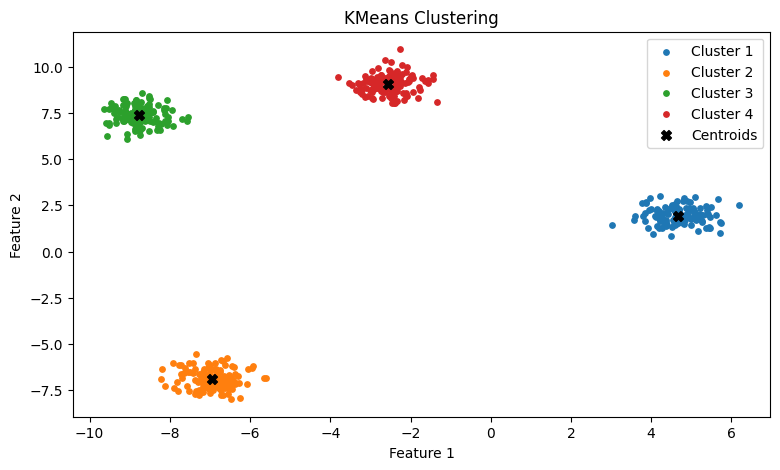

In [ ]:
blob_cluster_check(KMeansV1(K=4), n=500)

Sounds like we have a big problem here

## KMeans++



Seems like the basic random initilization of centroids may cause problems on *“far-off”* scattered data.

So we will be using a simple trick called Kmeans++, which picks centroids one by one, picking the next centeroid randomly but with probability proportional to its distance to the closest center.

In [ ]:
class KMeansV2(KMeansV1):
    def init_centroids(self, X):
        if self.verbose:
            print("Initilizing centroids")
        n = X.shape[0]
        self.centroids = []
        self.centroids.append(X[np.random.choice(n)])
        for i in range(self.K - 1):
            distances = self.transform(X)
            nearest_d2 = np.min(distances, axis=1) ** 2
            total_prob = np.sum(nearest_d2)
            probs = nearest_d2 / total_prob
            self.centroids.append(X[np.random.choice(n, p=probs)])
        self.centroids = np.array(self.centroids)

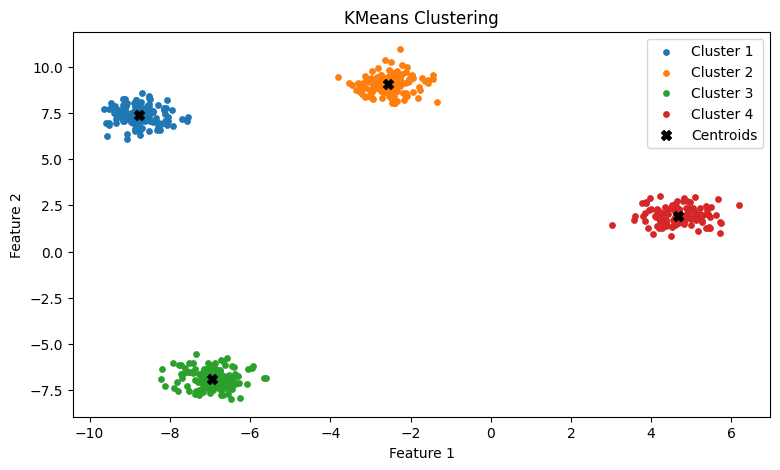

In [ ]:
blob_cluster_check(KMeansV2(K=4), n=500)

Nice, now that we have an acceptable model, we can proceed to use it on image data

## Downloading images from url (or just add them to /images dir)

For adding manually note that we only take jpeg in rgb format (not rgba)

In [ ]:
import requests
from PIL import Image
from io import BytesIO

def resize_image(image, max_size=512 * 512): # set max_size lower for downscaling and faster training
    width, height = image.size
    if width * height > max_size:
        scale = (max_size / (width * height)) ** 0.5
        width = int(width * scale)
        height = int(height * scale)
    return image.resize((width, height), Image.LANCZOS)

def download_image(url, file_name ,path='images'):
    response = requests.get(url)

    os.makedirs(path, exist_ok=True)
    file_path = os.path.join(path, file_name + '.jpg')

    if response.status_code == 200:
        image = Image.open(BytesIO(response.content))
        resize_image(image).convert('RGB').save(file_path, 'JPEG')
        print(f"Image downloaded and saved as {file_path}")
    else:
        print(f"Failed to download image. Status code: {response.status_code}")

In [ ]:
urls = [
    ('lena', 'https://static.wikia.nocookie.net/computervision/images/3/34/Lenna.jpg/revision/latest?cb=20050408081934'),
    #('bnha', 'https://static.wikia.nocookie.net/bokunoheroacademia/images/5/55/Season_5_DVD_Promo_Heroes.png/revision/latest/scale-to-width-down/1000?cb=20210905211424'),
    ('peppers', 'https://media.springernature.com/lw685/springer-static/image/art%3A10.1007%2Fs11082-023-05639-2/MediaObjects/11082_2023_5639_Fig5_HTML.jpg?as=webp'),
    ('jet', 'https://images-na.ssl-images-amazon.com/images/I/514dO3o-OuL.jpg')
]

for name, url in urls:
    download_image(url, name)

Image downloaded and saved as images/lena.jpg
Image downloaded and saved as images/peppers.jpg
Image downloaded and saved as images/jet.jpg


In [ ]:
!rm -rf `find -type d -name .ipynb_checkpoints`

## Quantization with RGB vector space

In [ ]:
def load_rgb(path='images'):
    data = []
    for image_file in os.listdir(os.path.join(path)):
        image_path = os.path.join(path, image_file)
        image_colors = np.array(Image.open(image_path))
        data.append(image_colors)
    return data

def show_image(arr, shape, title, color_space):
    arr = arr.reshape(shape)
    if color_space == 'LAB':
        arr = arr.astype(np.uint8) # programming is stupid ngl
        arr = cv2.cvtColor(arr, cv2.COLOR_LAB2RGB)
    plt.imshow(arr)
    plt.axis('off')
    plt.title(title)
    plt.show()

def quantize(image, model, color_space, short=False): # 'RGB' or 'LAB'
    X = image.reshape(-1, 3)
    if color_space == 'LAB':
        L = X[:, 0]
        X = X[:, 1:]

    start_time = time.time()
    model.fit(X)

    end_time = time.time()
    target = model.centroids[model.predict(X)]
    target = np.rint(target).astype(int)
    if color_space == 'LAB':
        target = np.column_stack((L, target))

    if short:
        arr = target
        arr = arr.reshape(image.shape)
        if color_space == 'LAB':
            arr = arr.astype(np.uint8) # programming is stupid ngl
            arr = cv2.cvtColor(arr, cv2.COLOR_LAB2RGB)
        return arr, int(model.distortion(X)), int(end_time - start_time)

    show_image(image, image.shape, 'original image', color_space)
    show_image(target, image.shape, 'quantized image', color_space)

    if color_space == 'LAB': # 2D visualization for LAB, since luminosity doesn't matter
        labels = model.predict(X)
        plt.figure(figsize=(10, 6))
        for i in range(model.K):
            plt.scatter(X[labels == i][:, 0], X[labels == i][:, 1], s=1)
        plt.scatter(model.centroids[:, 0], model.centroids[:, 1], s=50, c='k', marker='X')
        plt.title("KMeans Clustering")
        plt.xlabel("Feature 1")
        plt.ylabel("Feature 2")
        plt.legend()
        plt.show()

    return model.distortion(X), end_time - start_time # returns evaluation

Initilizing centroids
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24


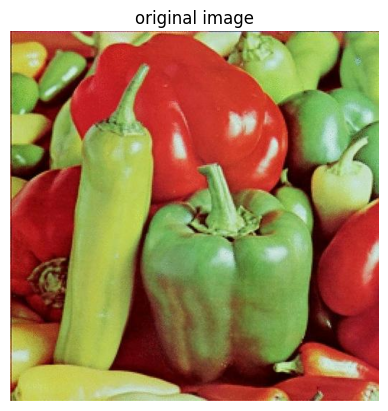

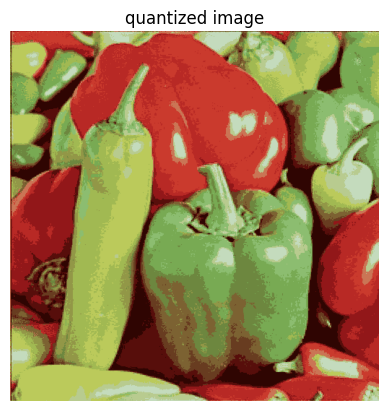

(98567214.89999422, 28.609575271606445)

In [ ]:
quantize(load_rgb()[0], KMeansV2(K=16, verbose=True), color_space='RGB')

## Quantization using L\*A\*B\* color space

The results are fair enough, but what if we don't use raw rgb itself? Turns out there's a better color space named [CIELAB](https://en.wikipedia.org/wiki/CIELAB_color_space) or L\*A\*B\* that is specifically made for this task, which means uniform changes of components in the L\*a\*b\* color space aim to correspond to uniform changes in perceived color.

Also a benefit is that luminosity layer L\* is not incorporated to the quantization process since all of the color information is appeared in the a\* and b\* layers.

In [ ]:
import cv2

def load_lab(path='images'):
    data = []
    for image_file in os.listdir(os.path.join(path)):
        image_path = os.path.join(path, image_file)

        bgr_image = cv2.imread(image_path) # cv2 loads images in bgr by default
        lab_image = cv2.cvtColor(bgr_image, cv2.COLOR_BGR2LAB)

        data.append(np.array(lab_image))
    return data

We could also use our custom scalers along with it, but it can be proven that it worstens the results (you can try it), so let's ignore them

In [ ]:
def standard_scale(data):
    mean = data.mean()
    std = data.std()
    return (data - mean) / std, mean, std

def inverse_standard_scale(data, mean, std):
    return data * std + mean

Initilizing centroids
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24


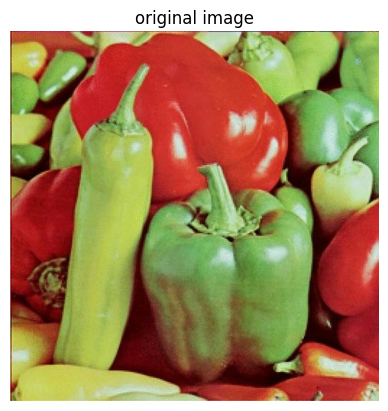

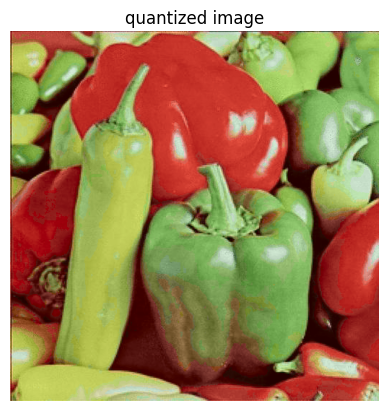

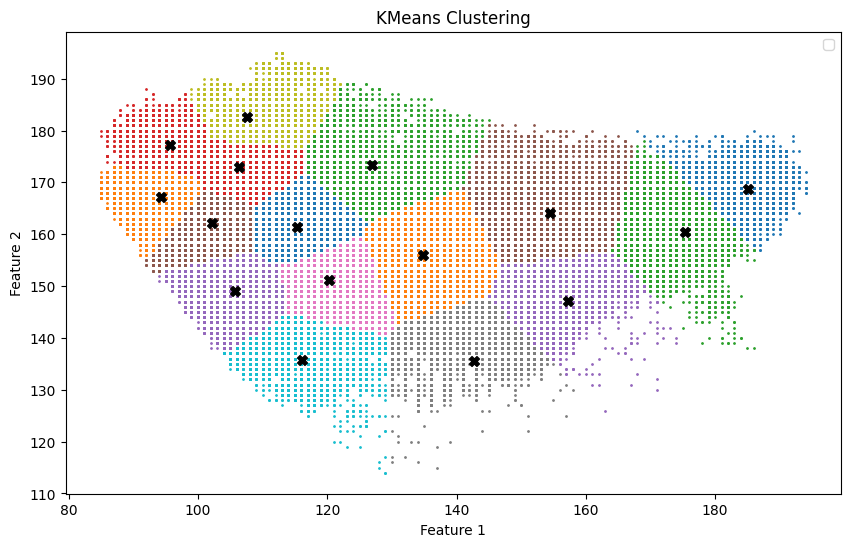

(8016884.675983902, 27.45470094680786)

In [ ]:
quantize(load_lab()[0], KMeansV2(K=16, verbose=True), color_space='LAB')

Best we got so far, but not good enough

## Rerolling KMeans

So we tried kmeans++ for centroid initilizaion instead of random choice. Altough that we can prove that kmeans converges at some point, it still would be stuck on a local minima and not necessarily the global minimum.


One way of addressing this problem is to simply run kmeans multiple times, which doesn't come to our interests, we can reroll our convergance better than random.


The better approach that comes to mind, is trying to improve the clustering after kmeans fits it's data. We could try to move bad centroids (centroids that are too near to each other) to other places (that is, maybe to the points that are furthest away from their centroid).

In [ ]:
class KMeansV3(KMeansV2):
    def __init__(self, n_reroll=3, n_worst_reroll=5, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.n_reroll = n_reroll
        self.n_worst_reroll = n_worst_reroll

    def reroll(self, X):

        def worst_cent():
            cent_distances = self.transform(self.centroids)
            cent_distances = cent_distances + np.diag(np.repeat(np.inf, cent_distances.shape[0]))
            mnn = np.argmin(cent_distances)
            i, j = np.unravel_index(mnn, cent_distances.shape)
            return i if np.mean(cent_distances[i]) < np.mean(cent_distances[j]) else j

        def best_swap():
            distances = self.transform(X)
            mxx = np.argpartition(distances.flatten(), -self.n_worst_reroll)[-self.n_worst_reroll:]
            mxx = np.random.choice(mxx)
            i, j = np.unravel_index(mxx, distances.shape)
            return i

        if self.verbose:
            print('Rerolling centroids')
        best_centroids = self.centroids.copy()
        best_distortion = self.distortion(X)
        for reroll_epoch in range(self.n_reroll):
            if self.verbose:
                print(f'Reroll epoch {reroll_epoch}')

            self.centroids[worst_cent()] = X[best_swap()]
            self.converge(X)

            distortion = self.distortion(X)
            if distortion < best_distortion:
                if self.verbose:
                    print('Better centroids found!')
                best_centroids = self.centroids.copy()
                best_distortion = distortion

        self.centroids = best_centroids

    def fit(self, X):
        super().fit(X)
        self.reroll(X)

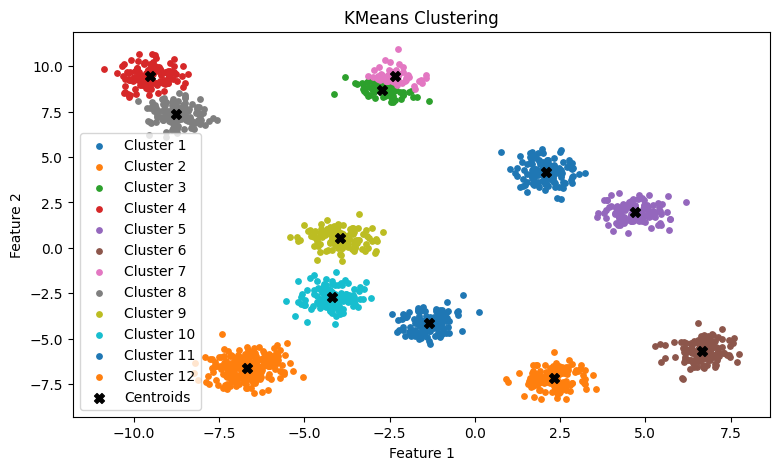

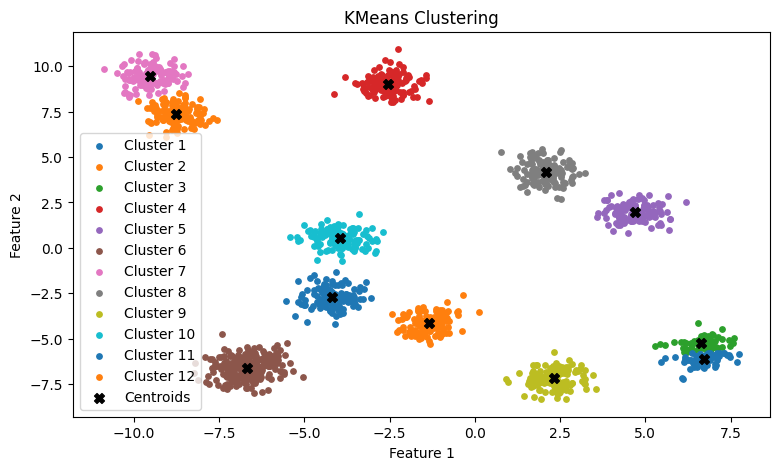

In [ ]:
blob_cluster_check(KMeansV2(K=12, max_iter=500), n=1500)
blob_cluster_check(KMeansV3(K=12, max_iter=500, n_reroll=10, n_worst_reroll=5), n=1500)

Now lets try it on our images

Initilizing centroids
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
Rerolling centroids
Reroll epoch 0
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
Better centroids found!
Reroll epoch 1
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
Better centroids found!
Reroll epoch 2
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoc

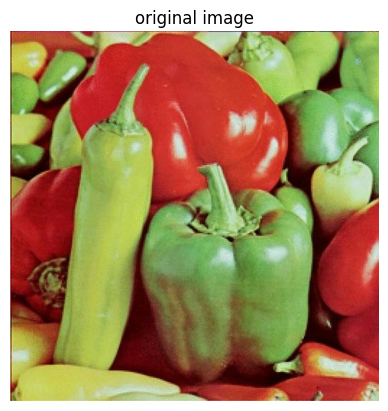

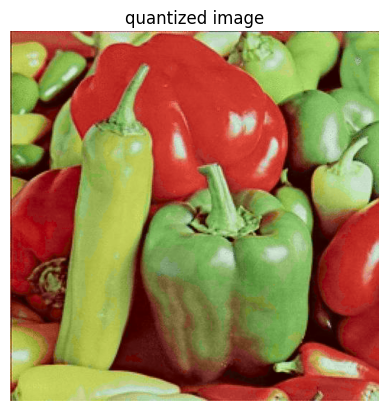

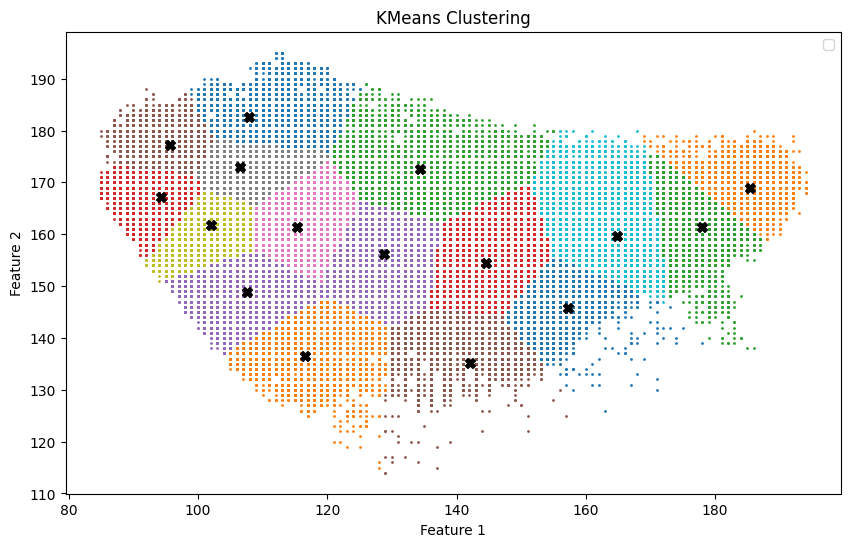

(7570623.323234281, 107.94264531135559)

In [ ]:
quantize(load_lab()[0], KMeansV3(K=16, n_reroll=3, n_worst_reroll=5, verbose=True), color_space='LAB')

## Fuzzy CMeans

There's a probability approach to KMeans, in which, instead of clustering points into fixed centroids/labels, we will give them a probability based on how far they are from each centroid.

In [ ]:
class KMeansV4(KMeansV3):
    def __init__(self, fuzziness=2, n_reroll=0, n_worst_reroll=1, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.fuzziness = fuzziness # fuzziness parameter

    def get_membership(self, X):
        distances = self.transform(X)
        distances = np.fmax(distances, np.finfo(np.float64).eps)  # avoiding div by zero
        inv_dist = 1 / distances
        inv_dist = inv_dist ** (2 / (self.fuzziness - 1))
        membership = inv_dist / np.sum(inv_dist, axis=1, keepdims=True)
        return membership

    def update_membership(self, X): # keep in mind that for FCM tolerance is based on membership matrix
        new_membership = self.get_membership(X)
        if np.linalg.norm(new_membership - self.membership) <= self.tol:
            self.membership = new_membership
            return True
        else:
            self.membership = new_membership
            return False

    def init_centroids(self, X):
        super().init_centroids(X)
        self.membership = self.get_membership(X)

    def update_centroids(self, X):
        um = self.membership ** self.fuzziness
        self.centroids = (um.T @ X) / np.sum(um.T, axis=1, keepdims=True)
        return self.update_membership(X)

    def predict(self, X):
        return self.get_membership(X).argmax(axis=1)

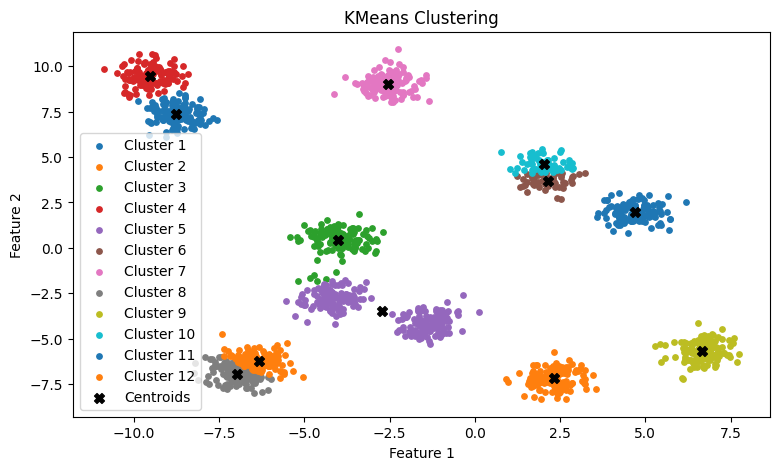

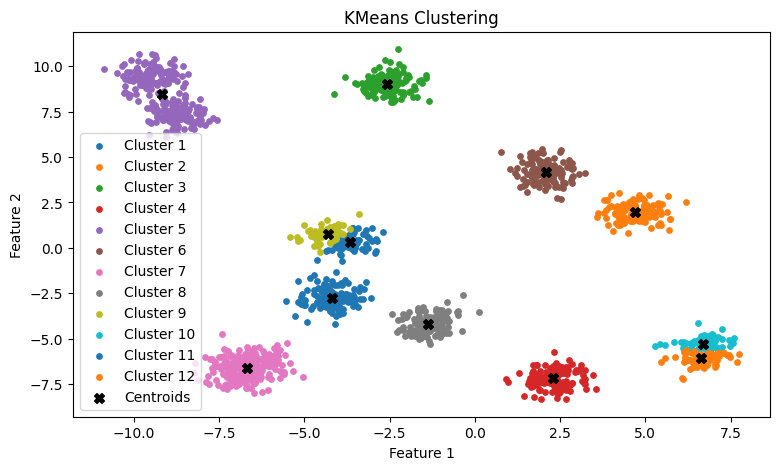

In [ ]:
blob_cluster_check(KMeansV2(K=12, max_iter=500), n=1500)
blob_cluster_check(KMeansV4(K=12, max_iter=500), n=1500)

We've also combined FCM with rerolling method for better results

Initilizing centroids
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
Rerolling centroids
Reroll epoch 0
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
Better centroids found!
Reroll epoch 1
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
epoch 17
epoch 18
epoch 19
epoch 20
epoch 21
epoch 22
epoch 23
epoch 24
Reroll epoch 2
Converging the centroids
epoch 0
epoch 1
epoch 2
epoch 3
epoch 4
epoch 5
epoch 6
epoch 7
epoch 8
epoch 9
epoch 10
epoch 11
epoch 12
epoch 13
epoch 14
epoch 15
epoch 16
e

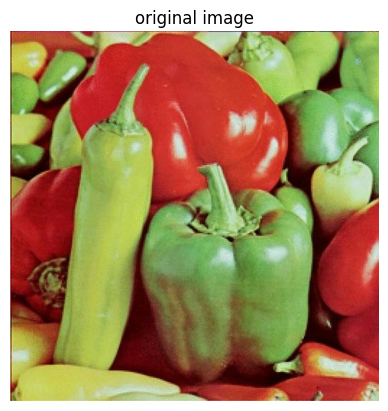

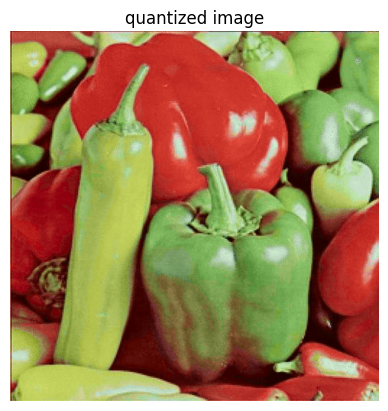

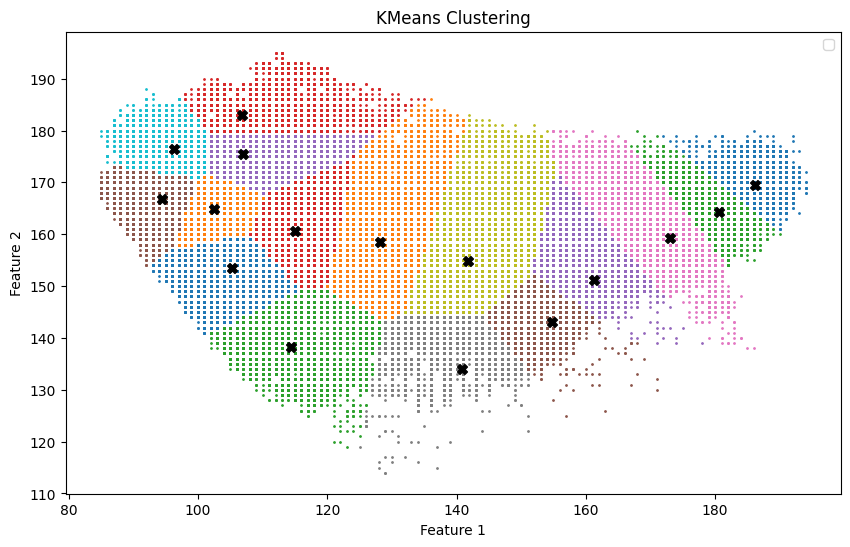

(8148668.454861004, 39.321367025375366)

In [ ]:
quantize(load_lab()[0], KMeansV4(K=16, n_reroll=3, n_worst_reroll=5, verbose=True), color_space='LAB')

## Hybrid KMeans using swarm intelligence (Artificial Bee Colony)

There are many swam intelligence optimization algorithms inspired by nature, but after a research, the best one for CIQ task seems to be Particle Swarm
Optimization (PSO) and Artificial Bee Colony (ABC) with a litte bit better results, so here we implement ABC.

In [ ]:
def L2_norm(X, centroids):
    distances = np.linalg.norm(X[:, np.newaxis] - centroids, axis=2)
    return distances

def cluster(X, centroids):
    distances = L2_norm(X, centroids)
    return np.argmin(distances, axis=1)

class KMeansV5:
    def __init__(self, K=16, KM_max_iter=3, PKM=0.1,
                 P=10, max_iter=10, trial_limit=5,
                 verbose=False, log_file_name=None):
        self.K = K
        self.PKM = PKM # Probability of running KMeans at each step
        self.P = P
        self.max_iter = max_iter
        self.trial_limit = trial_limit
        self.verbose = verbose # TODO: too lazy to do this now
        self.log_file_name = log_file_name # TODO: for this too

        self.food_sources = None # P sets of centroids
        self.fitnesses = None # fitness value for each solution
        self.trials = None # unsucessfull trials tried for each solution

        self.best_fitness = 0
        self.best_solution = None

        # self.kmeans = KMeansV1(K=K, tol=0, max_iter=KM_max_iter)

    def fitness(self, X, centroids):
        labels = cluster(X, centroids)
        distortion = 0.0
        for i in range(len(centroids)):
            cluster_points = X[labels == i]
            if len(cluster_points) > 0:
                distortion += np.sum(np.linalg.norm(cluster_points - centroids[i], axis=1) ** 2)
        return 1 / (1 + distortion)

    def initialize(self, X):
        if self.verbose:
            print(f"Initializing {self.P} food sources (solutions) randomly")

        self.food_sources = [X[np.random.choice(X.shape[0], self.K, replace=False)] for _ in range(self.P)]
        self.fitnesses = [self.fitness(X, fs) for fs in self.food_sources]
        self.trials = np.zeros(self.P)

    def mutate_solution(self, i):
        solution = self.food_sources[i]
        neighbor = self.food_sources[np.random.choice([j for j in range(self.P) if j != i])]
        phi = np.random.uniform(-1, 1, solution.shape)
        mutated_solution = solution + phi * (solution - neighbor)
        # alpha = np.random.rand(solution.shape[1])
        # mutated_solution = alpha * solution + (1 - alpha) * neighbor
        return mutated_solution

    def apply_kmeans(self, X, i): # TODO: maybe do this using only one kmeans class?
        if np.random.rand() < self.PKM:
            if self.verbose:
                print("Bees considered applying k-means to imporve current solution")

            kmeans = KMeansV1(K=self.K, init=self.food_sources[i], tol=0, max_iter=5)
            kmeans.fit(X)
            self.food_sources[i] = kmeans.centroids
            # self.kmeans.centroids = self.food_sources[i]
            # self.kmeans.fit(X)
            # self.food_sources[i] = self.kmeans.centroids # we don't actually need this line?

    def employed_bee_phase(self, X):
        if self.verbose:
            print("Employed Bee Phase")
        for i in range(self.P):
            if self.verbose:
                print(f"Employed Bee wandering around solution {i}")

            self.apply_kmeans(X, i)
            self.fitnesses[i] = self.fitness(X, self.food_sources[i])

            new_solution = self.mutate_solution(i)
            new_fitness = self.fitness(X, new_solution)

            if new_fitness > self.fitnesses[i]:
                if self.verbose:
                    print(f"Better food source found around solution {i}")

                self.food_sources[i] = new_solution
                self.fitnesses[i] = new_fitness
                self.trials[i] = 0
            else:
                self.trials[i] += 1

    def onlooker_bee_phase(self, X):
        if self.verbose:
            print("Onlooker Bee Phase")
        probabilities = self.fitnesses / np.sum(self.fitnesses)
        for i in range(self.P):
            if np.random.rand() < probabilities[i]:
                if self.verbose:
                    print(f"Onlooker Bee chose solution {i} as a great fitness solution")

                self.apply_kmeans(X, i)
                self.fitnesses[i] = self.fitness(X, self.food_sources[i])

                new_solution = self.mutate_solution(i)
                new_fitness = self.fitness(X, new_solution)

                if new_fitness > self.fitnesses[i]:
                    if self.verbose:
                        print(f"Better food source found around solution {i}")

                    self.food_sources[i] = new_solution
                    self.fitnesses[i] = new_fitness
                    self.trials[i] = 0
                else:
                    self.trials[i] += 1

            if self.fitnesses[i] > self.best_fitness:
                if self.verbose:
                    print("Another best food source has been found!")

                self.best_fitness = self.fitnesses[i]
                self.best_solution = self.food_sources[i]

    def scout_bee_phase(self, X):
        if self.verbose:
            print("Scout Bee Phase")
        for i in range(self.P):
            if self.trials[i] >= self.trial_limit:
                if self.verbose:
                    print(f'No better food sources has been found around solution {i} for too long')
                    print(f'A scout bee is being sent to find another food source randomly')
                self.food_sources[i] = X[np.random.choice(X.shape[0], self.K, replace=False)]
                self.trials[i] = 0

    def fit(self, X):
        self.initialize(X)
        for epoch in range(self.max_iter):
            if self.verbose:
                print(f"Bee phase iteration {epoch}")
            self.employed_bee_phase(X)
            self.onlooker_bee_phase(X)
            self.scout_bee_phase(X)
        self.centroids = self.best_solution
        return self.centroids

    #### For post fit eval

    def predict(self, X):
        dist = np.linalg.norm(X[:, np.newaxis] - self.centroids, axis=2)
        return np.argmin(dist, axis=1)

    def distortion(self, X):
        centroids = self.centroids
        labels = cluster(X, centroids)
        distortion = 0.0
        for i in range(len(centroids)):
            cluster_points = X[labels == i]
            if len(cluster_points) > 0:
                distortion += np.sum(np.linalg.norm(cluster_points - centroids[i], axis=1) ** 2)
        return distortion

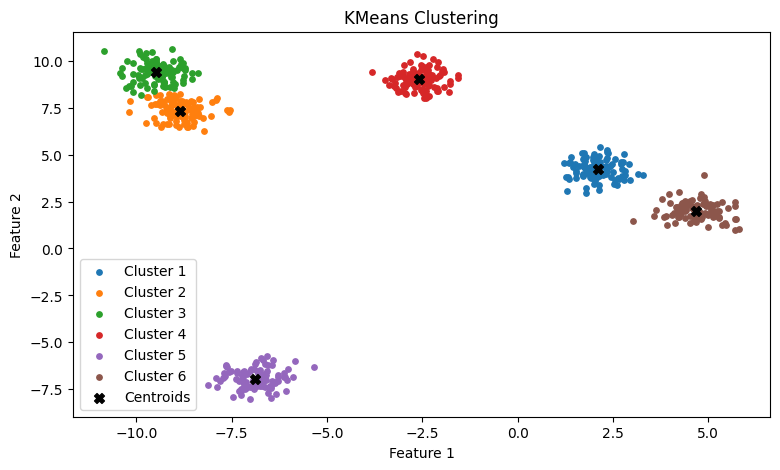

In [ ]:
blob_cluster_check(KMeansV5(K=6), n=600)

Initializing 10 food sources (solutions) randomly
Bee phase iteration 0
Employed Bee Phase
Employed Bee wandering around solution 0
Better food source found around solution 0
Employed Bee wandering around solution 1
Better food source found around solution 1
Employed Bee wandering around solution 2
Better food source found around solution 2
Employed Bee wandering around solution 3
Better food source found around solution 3
Employed Bee wandering around solution 4
Better food source found around solution 4
Employed Bee wandering around solution 5
Better food source found around solution 5
Employed Bee wandering around solution 6
Better food source found around solution 6
Employed Bee wandering around solution 7
Better food source found around solution 7
Employed Bee wandering around solution 8
Bees considered applying k-means to imporve current solution
Employed Bee wandering around solution 9
Better food source found around solution 9
Onlooker Bee Phase
Another best food source has bee

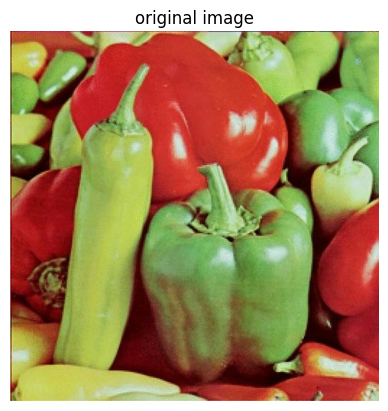

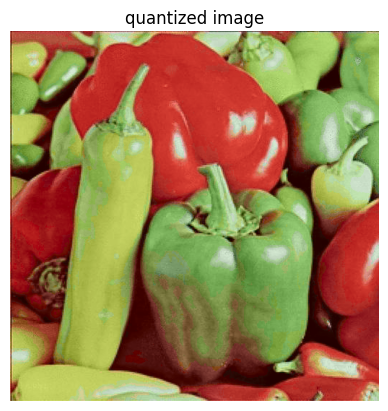

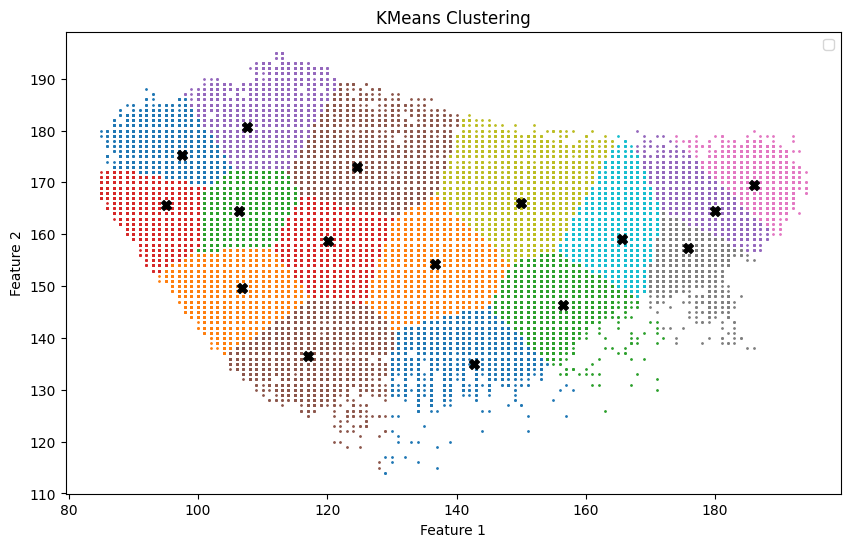

(7967318.017140433, 127.19155478477478)

In [ ]:
quantize(load_lab()[0], KMeansV5(K=16, verbose=True), color_space='LAB')

## Optimizing runtime

Implementation for weighted sort means (WSM): It basically solves a weighted version of KMeans

Since color spaces are bounded, this method seems to show promising results too.

In [ ]:
class KMeansV6: # question: can we use other methods to improve? probably yes
    def __init__(self, K=3, max_iter=100, tol=1e-4):
        self.K = K
        self.max_iter = max_iter
        self.tol = tol

    def init_centroids(self, X):
        random_indices = np.random.choice(X.shape[0], self.K, replace=False)
        self.centroids = X[random_indices]

    def transform(self, X):
        return np.linalg.norm(X[:, np.newaxis] - self.centroids, axis=2)

    def fit(self, X, weights):
        self.init_centroids(X)

        for i in range(self.max_iter):
            clusters = self.predict(X)

            new_centroids = np.zeros_like(self.centroids)
            for j in range(self.K):
                cluster_points = X[clusters == j]
                cluster_weights = weights[clusters == j]
                if len(cluster_points) > 0:
                    new_centroids[j] = np.sum(cluster_weights[:, np.newaxis] * cluster_points, axis=0) / np.sum(cluster_weights)

            if ((self.centroids - new_centroids)**2).sum() <= self.tol:
                break

            self.centroids = new_centroids

    def predict(self, X):
        distances = self.transform(X)
        return np.argmin(distances, axis=1)

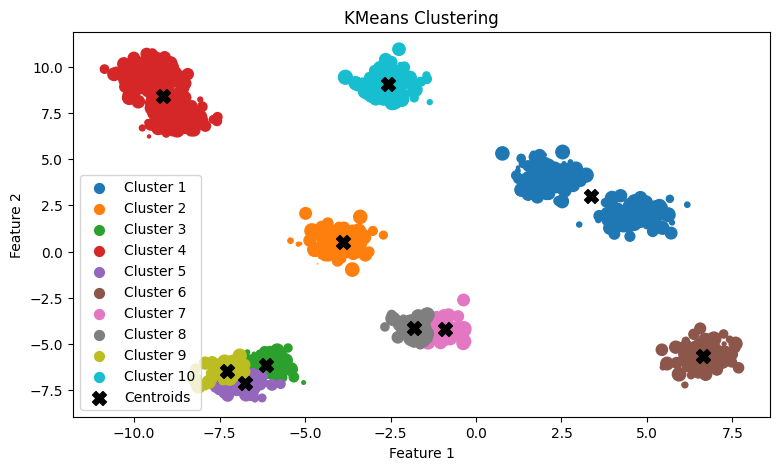

In [ ]:
model = KMeansV6(K=10)
X, _ = make_blobs(n_samples=1200, centers=10, cluster_std=0.5, random_state=SEED)
weights = np.random.rand(X.shape[0])

model.fit(X, weights)
labels = model.predict(X)

plt.figure(figsize=(9, 5))

for i in range(model.K):
    plt.scatter(X[labels == i][:, 0], X[labels == i][:, 1], s=weights[labels == i]*100, label=f'Cluster {i+1}')
plt.scatter(model.centroids[:, 0], model.centroids[:, 1], s=100, c='k', marker='X', label='Centroids')

plt.title("KMeans Clustering")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.legend()
plt.show()

We won't go further on and quantize using WSM, since it will just give the same results and only improves runtime. Another notable algorithm which gives faster runtimes is [Elkan](https://cdn.aaai.org/ICML/2003/ICML03-022.pdf)

## Results

Now we approach to use and compare all the above methods on all of images and see the results.

disclaimer: running all the codes below takes around 15+ mins for each image on colab

In [ ]:
import pandas as pd

models = [
    (KMeansV1, 'KM', {'K': 16}),
    (KMeansV2, 'KMpp', {'K': 16}),
    (KMeansV3, 'RKM', {'K': 16, 'n_reroll': 3, 'n_worst_reroll': 5}),
    (KMeansV4, 'FCM', {'K': 16, 'fuzziness': 2}), # without reroll
    (KMeansV5, 'ABC', {'K': 16}),
]
image_files = [image.rsplit('.', 1)[0] for image in os.listdir(os.path.join('images'))]

In [ ]:
rgb_df = pd.DataFrame(np.nan, index=image_files, columns=[model[1] for model in models])
lab_df = pd.DataFrame(np.nan, index=image_files, columns=[model[1] for model in models])

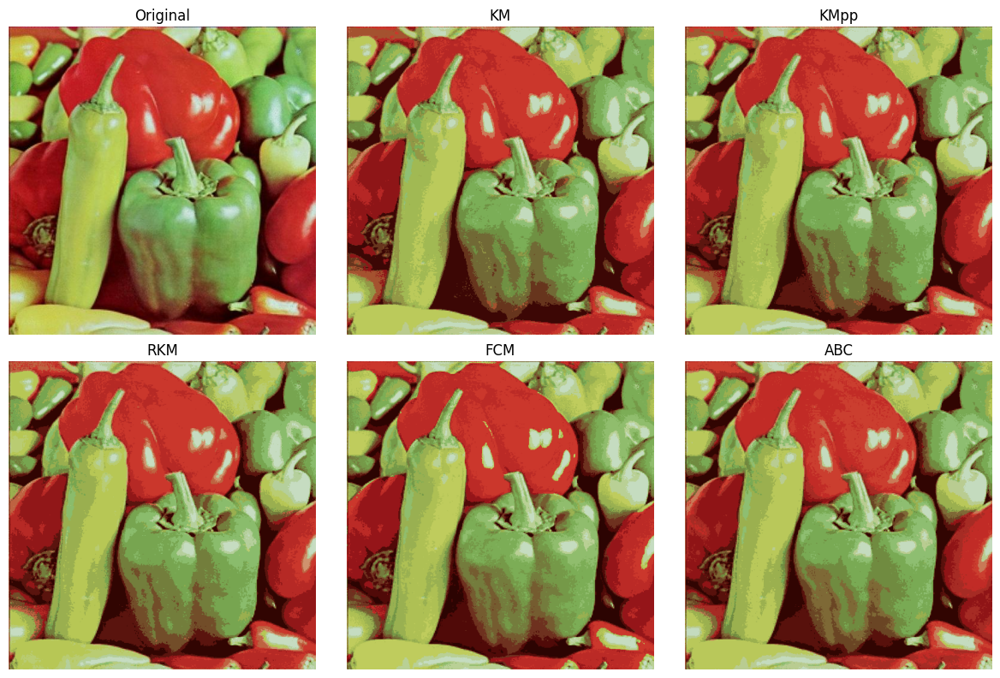

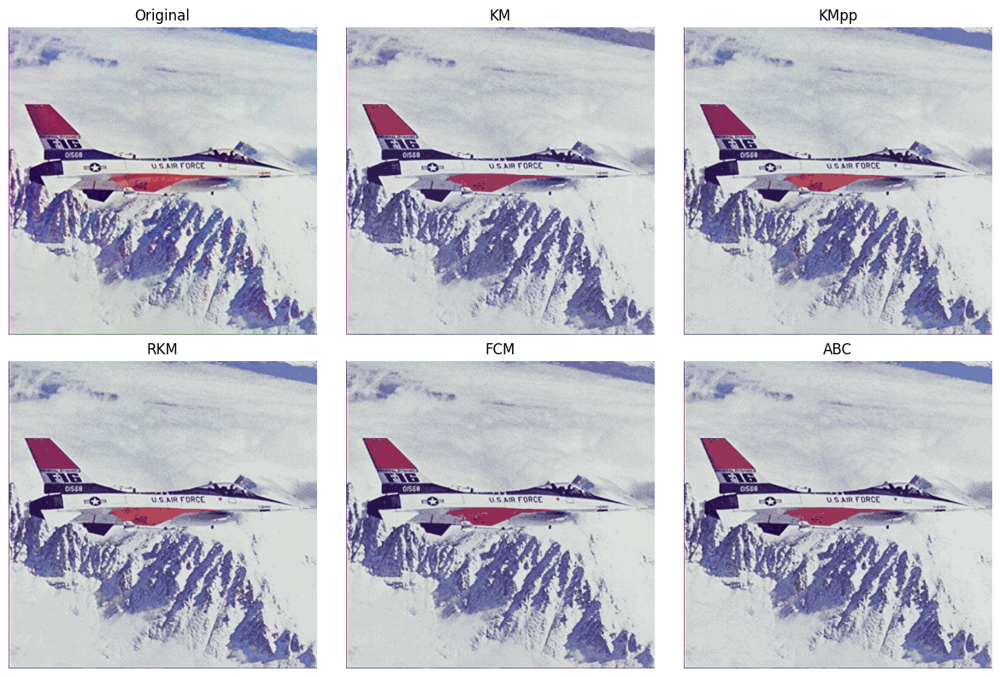

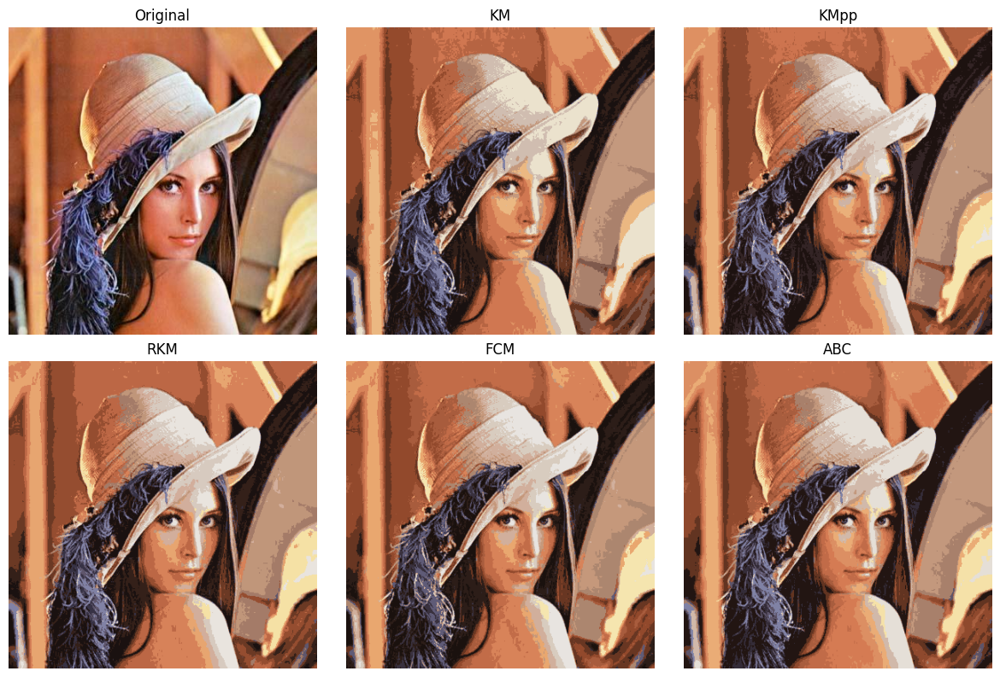

In [ ]:
for i, image in enumerate(load_rgb()):

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.flatten()

    axes[0].imshow(image)
    axes[0].set_title('Original')
    axes[0].axis('off')

    for j, (model, model_name, args) in enumerate(models, start=1):
        target, distortion, runtime = quantize(image, model(log_file_name=image_files[i]+'_'+model_name+'_RGB', **args), color_space='RGB', short=True)
        rgb_df.at[image_files[i], model_name] = distortion

        axes[j].imshow(target)
        axes[j].set_title(model_name)
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

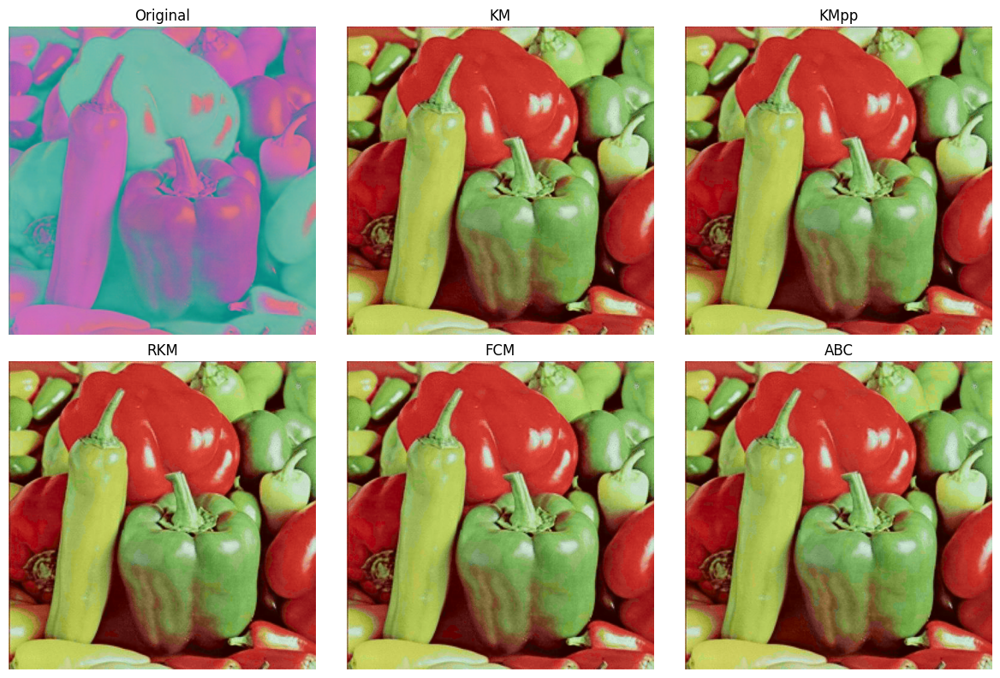

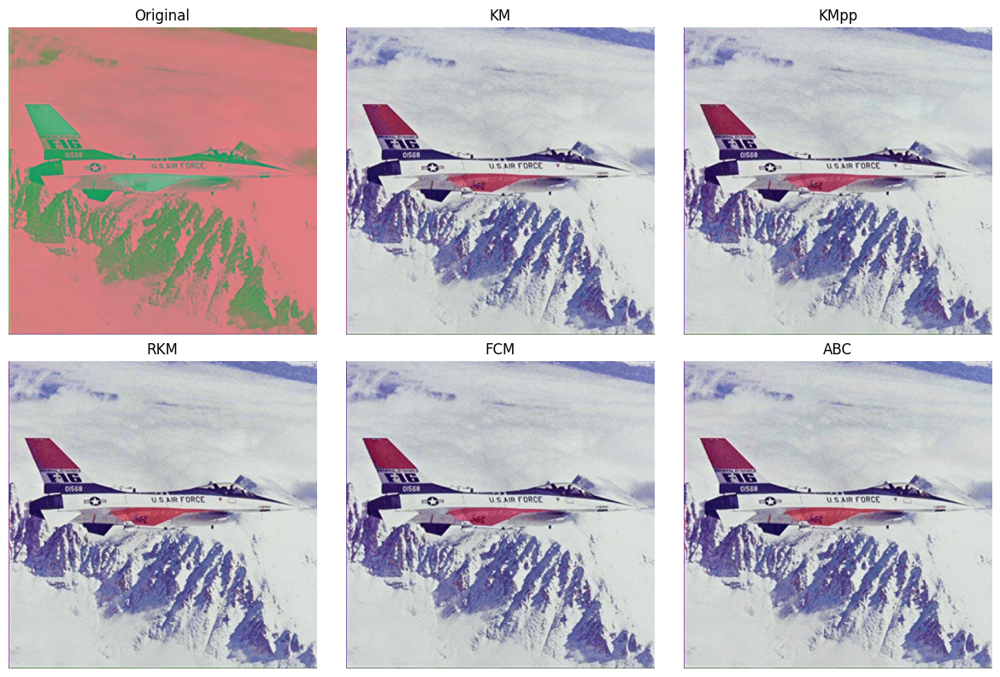

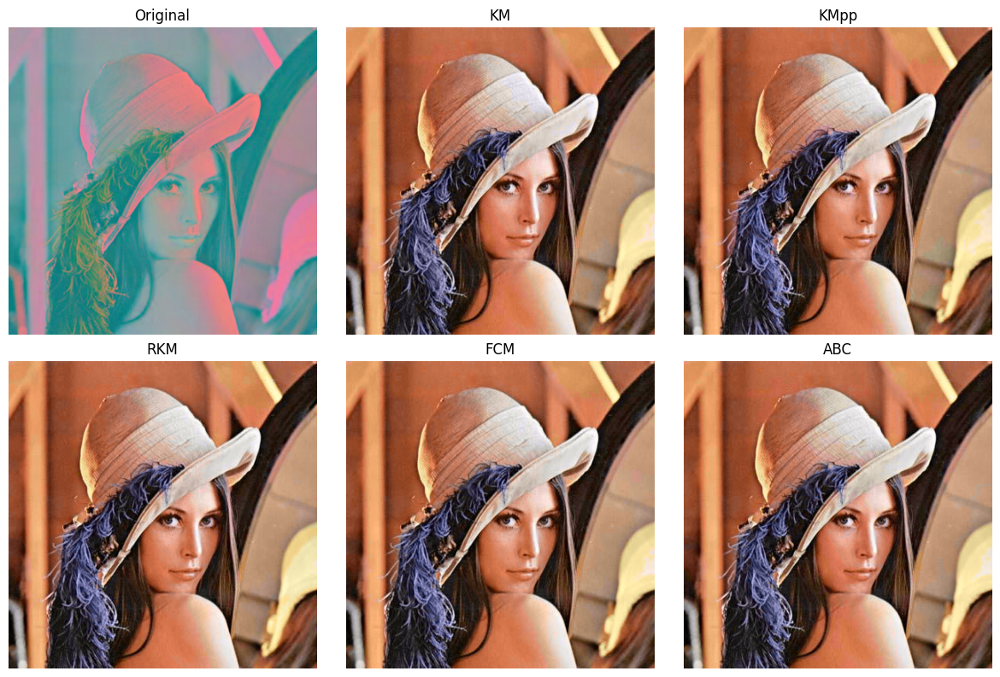

In [ ]:
for i, image in enumerate(load_lab()):

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.flatten()

    axes[0].imshow(image)
    axes[0].set_title('Original')
    axes[0].axis('off')

    for j, (model, model_name, args) in enumerate(models, start=1):
        target, distortion, runtime = quantize(image, model(log_file_name=image_files[i]+'_'+model_name+'_LAB', **args), color_space='LAB', short=True)
        lab_df.at[image_files[i], model_name] = distortion

        axes[j].imshow(target)
        axes[j].set_title(model_name)
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

Oops, I forgot to convert Lab to rgb before plotting the main image, this takes too long and I'm too lazy to redo.

Also I didn't really know to put the L into account when quantizing or not, that's why the pictures all are loooking so good. Anyways, it's easy to change any desired thing in the code!

In [ ]:
(rgb_df / 1e6).round(2)

,KM,KMpp,RKM,FCM,ABC
peppers,102.53,99.92,100.44,116.51,99.80
jet,48.40,39.16,38.10,43.27,44.26
lena,64.29,63.27,62.63,67.98,63.70


In [ ]:
(lab_df / 1e6).round(2)

,KM,KMpp,RKM,FCM,ABC
peppers,7.57,7.92,7.57,8.13,8.45
jet,2.23,2.56,2.17,2.88,2.34
lena,3.07,3.07,2.80,3.07,2.89


In general, RKM looks best (no wonder, since it's running k-means multiple times). While normal FCM isn't any better than k-means, and ABC results are so great.